<a href="https://colab.research.google.com/github/escuccim/faceswap/blob/master/PyTorchFaceSwap_128i.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Based on https://github.com/Oldpan/Faceswap-Deepfake-Pytorch, I have made several changes:
 - replaced the PixelShuffler with transpose convolutions because it makes more sense to do it that way.
 - replaced the sigmoids with tanhs, because I think it's a better activation function in this context.
 - implemented pytorch dataloaders to load the data; replaced the cv2 transformations with torchvision transforms where possible. This seems slower, but it may be due to the fact that we are no longer training on one batch per epoch. This also allows us to train on more data than can fit into RAM.
 - replaced the code to plot the images during training with something that is easier to understand. The old code did some weird transposes that didn't work properly when loading the data from dataloaders.
 - removed 3x3 normal conv from decoder and replaced with a transpose conv with stride 1 to attempt to smooth out artifacts.

**Issues**

 - I have some concerns about using a normal convolution at the end of the Decoding, this may be changed after I see how the results are.
 - The images seem to have more deconv-related artifacts than the original code did, resulting in more pixelated and less smooth output. This may need to be addressed after we see how the results are after training.

**Updates**

 - Replacing the last conv in the decoder with a transpose conv with stride 1 made the decoded images much better, but the swapped images were of significantly worse quality. I removed this and replaced the old conv, changing it to 3x3 from 5x5.
 - b : The original model was too big, I am reducing the size because there isn't really enough data to train such a large model.
 - c : Removing even more parameters
 - d : Adding some parameters back to encoder
 - e : Same as d, but using three decoders so encoder is trained to encode a lot more images than just for two people. This should make it quicker and easier to re-train for new people.
 - f : Adding some parameters to encoder and decoder as it seems to have trouble with the larger dataset.
 - g : Removing some params from encoder for faster training ?
 - h : Adding more parameters back to decoder
 - i : Tweaking decoder
 

In [2]:
!nvidia-smi

Thu Mar 19 06:53:01 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.59       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   62C    P8    11W /  70W |      0MiB / 15079MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [3]:
import torch
import torchvision
from torch.utils.data import DataLoader
from matplotlib import pyplot as plt, colors
%matplotlib inline
import zipfile
import os
import matplotlib.animation as animation
import torchvision.utils as vutils
import numpy as np
import random
import shutil
import pandas as pd
import torch.nn.functional as F
from torch.autograd import Variable
from torch.utils.data import Dataset
from torch.optim import RMSprop,Adam,SGD
from torch.optim.lr_scheduler import ExponentialLR,MultiStepLR
import progressbar
from torchvision.utils import make_grid
from torchvision import models
from scipy.io import loadmat
from google.colab import auth
import PIL
import torch.utils.data
from torch import nn, optim
import torch.backends.cudnn as cudnn
import numpy
import torch.utils.data
from torch.nn import functional as F
import math
from torch.nn.parameter import Parameter
from torch.nn.functional import pad
import cv2
from torch.nn.modules import Module
from torch.nn.modules.utils import _single, _pair, _triple

from google.colab.patches import cv2_imshow
auth.authenticate_user()

# upload checkpoint to GCS
project_id = 'mammography-198911'
bucket_name = 'gan-faces'

!gcloud config set project {project_id}

Updated property [core/project].


To take a quick anonymous survey, run:
  $ gcloud survey



In [4]:
# download the model checkpoint
!mkdir checkpoint
!gsutil cp gs://{bucket_name}/autoencoder128i.pt ./checkpoint/autoencoder128i.pt

Copying gs://gan-faces/autoencoder128i.pt...
\ [1 files][  1.4 GiB/  1.4 GiB]   81.2 MiB/s                                   
Operation completed over 1 objects/1.4 GiB.                                      


In [5]:
if not os.path.exists("data/female"):
    !mkdir data
    !mkdir data/female
    !mkdir data/male

# if not os.path.exists("celeba-dataset.zip"):
# #   !kaggle datasets download -d jessicali9530/celeba-dataset
#   !gsutil cp gs://{bucket_name}/celeba-dataset.zip ./celeba-dataset.zip
#   zip_ref = zipfile.ZipFile('celeba-dataset.zip', 'r')
#   zip_ref.extractall('data')
#   zip_ref.close()

#   zip_ref = zipfile.ZipFile('data/img_align_celeba.zip', 'r')
#   zip_ref.extractall('data/images')
#   zip_ref.close()

# if not os.path.exists("imdb_crop_good.zip"):  
#   !gsutil cp gs://{bucket_name}/imdb_crop_good.zip ./imdb_crop_good.zip
#   zip_ref = zipfile.ZipFile('imdb_crop_good.zip', 'r')
#   zip_ref.extractall('data/images/imdb')
#   zip_ref.close()

# if not os.path.exists("celeba_by_age.zip"):  
#   !gsutil cp gs://{bucket_name}/celeba_by_age.zip ./celeba_by_age.zip
#   zip_ref = zipfile.ZipFile('celeba_by_age.zip', 'r')
#   zip_ref.extractall('data_celeb_age')
#   zip_ref.close()

# if not os.path.exists("celeba_by_gender.zip"):  
#   !gsutil cp gs://{bucket_name}/celeba_by_gender.zip ./celeba_by_gender.zip
#   zip_ref = zipfile.ZipFile('celeba_by_gender.zip', 'r')
#   zip_ref.extractall('data_celeb')
#   zip_ref.close()
#   !mv data_celeb/celeba/female/ data/female/
#   !mv data_celeb/celeba/male/ data/male/

if not os.path.exists("named_celebs_good_by_gender.zip"):  
  !gsutil cp gs://{bucket_name}/named_celebs_good_by_gender.zip ./named_celebs_good_by_gender.zip
  zip_ref = zipfile.ZipFile('named_celebs_good_by_gender.zip', 'r')
  zip_ref.extractall('data')
  zip_ref.close()
  !mv data/named_celebs_good_by_gender/female/* data/female/
  !mv data/named_celebs_good_by_gender/male/* data/male/

Copying gs://gan-faces/named_celebs_good_by_gender.zip...
- [1 files][ 75.9 MiB/ 75.9 MiB]                                                
Operation completed over 1 objects/75.9 MiB.                                     


In [0]:
random_transform_args = {
    'rotation_range': 10,
    'zoom_range': 0.05,
    'shift_range': 0.05,
    'random_flip': 0.4,
}

def get_training_data(images, batch_size):
    indices = numpy.random.randint(len(images), size=batch_size)
    for i, index in enumerate(indices):
        image = images[index]
        image = random_transform(image, **random_transform_args)
        warped_img, target_img = random_warp(image)

        if i == 0:
            warped_images = numpy.empty((batch_size,) + warped_img.shape, warped_img.dtype)
            target_images = numpy.empty((batch_size,) + target_img.shape, warped_img.dtype)

        warped_images[i] = warped_img
        target_images[i] = target_img

    return warped_images, target_images

def get_image_paths(directory):
    return [x.path for x in os.scandir(directory) if x.name.endswith(".jpg") or x.name.endswith(".png")
            or x.name.endswith(".JPG")]


def load_images(image_paths, convert=None):
    iter_all_images = (cv2.resize(cv2.imread(fn), (256, 256)) for fn in image_paths)
    if convert:
        iter_all_images = (convert(img) for img in iter_all_images)
    for i, image in enumerate(iter_all_images):
        if i == 0:
            all_images = numpy.empty((len(image_paths),) + image.shape, dtype=image.dtype)
        all_images[i] = image

# # License (Modified BSD) # Copyright (C) 2011, the scikit-image team All rights reserved. # # Redistribution and
# use in source and binary forms, with or without modification, are permitted provided that the following conditions
# are met: # # Redistributions of source code must retain the above copyright notice, this list of conditions and the
#  following disclaimer. # Redistributions in binary form must reproduce the above copyright notice, this list of
# conditions and the following disclaimer in the documentation and/or other materials provided with the distribution.
#  Neither the name of skimage nor the names of its contributors may be used to endorse or promote products derived
# from this software without specific prior written permission. # THIS SOFTWARE IS PROVIDED BY THE AUTHOR ``AS IS''
# AND ANY EXPRESS OR IMPLIED WARRANTIES, INCLUDING, BUT NOT LIMITED TO, THE IMPLIED WARRANTIES OF MERCHANTABILITY AND
#  FITNESS FOR A PARTICULAR PURPOSE ARE DISCLAIMED. IN NO EVENT SHALL THE AUTHOR BE LIABLE FOR ANY DIRECT, INDIRECT,
# INCIDENTAL, SPECIAL, EXEMPLARY, OR CONSEQUENTIAL DAMAGES (INCLUDING, BUT NOT LIMITED TO, PROCUREMENT OF SUBSTITUTE
# GOODS OR SERVICES; LOSS OF USE, DATA, OR PROFITS; OR BUSINESS INTERRUPTION) HOWEVER CAUSED AND ON ANY THEORY OF
# LIABILITY, WHETHER IN CONTRACT, STRICT LIABILITY, OR TORT (INCLUDING NEGLIGENCE OR OTHERWISE) ARISING IN ANY WAY
# OUT OF THE USE OF THIS SOFTWARE, EVEN IF ADVISED OF THE POSSIBILITY OF SUCH DAMAGE.

# umeyama function from scikit-image/skimage/transform/_geometric.py

import numpy as np


def umeyama(src, dst, estimate_scale):
    """Estimate N-D similarity transformation with or without scaling.
    Parameters
    ----------
    src : (M, N) array
        Source coordinates.
    dst : (M, N) array
        Destination coordinates.
    estimate_scale : bool
        Whether to estimate scaling factor.
    Returns
    -------
    T : (N + 1, N + 1)
        The homogeneous similarity transformation matrix. The matrix contains
        NaN values only if the problem is not well-conditioned.
    References
    ----------
    .. [1] "Least-squares estimation of transformation parameters between two
            point patterns", Shinji Umeyama, PAMI 1991, DOI: 10.1109/34.88573
    """

    num = src.shape[0]
    dim = src.shape[1]

    # Compute mean of src and dst.
    src_mean = src.mean(axis=0)
    dst_mean = dst.mean(axis=0)

    # Subtract mean from src and dst.
    src_demean = src - src_mean
    dst_demean = dst - dst_mean

    # Eq. (38).
    A = np.dot(dst_demean.T, src_demean) / num

    # Eq. (39).
    d = np.ones((dim,), dtype=np.double)
    if np.linalg.det(A) < 0:
        d[dim - 1] = -1

    T = np.eye(dim + 1, dtype=np.double)

    U, S, V = np.linalg.svd(A)

    # Eq. (40) and (43).
    rank = np.linalg.matrix_rank(A)
    if rank == 0:
        return np.nan * T
    elif rank == dim - 1:
        if np.linalg.det(U) * np.linalg.det(V) > 0:
            T[:dim, :dim] = np.dot(U, V)
        else:
            s = d[dim - 1]
            d[dim - 1] = -1
            T[:dim, :dim] = np.dot(U, np.dot(np.diag(d), V))
            d[dim - 1] = s
    else:
        T[:dim, :dim] = np.dot(U, np.dot(np.diag(d), V.T))

    if estimate_scale:
        # Eq. (41) and (42).
        scale = 1.0 / src_demean.var(axis=0).sum() * np.dot(S, d)
    else:
        scale = 1.0

    T[:dim, dim] = dst_mean - scale * np.dot(T[:dim, :dim], src_mean.T)
    T[:dim, :dim] *= scale

    return T

random_transform_args = {
    'rotation_range': 10,
    'zoom_range': 0.05,
    'shift_range': 0.05,
    'random_flip': 0.5,
}


def random_transform(image, rotation_range, zoom_range, shift_range, random_flip):
    h, w = image.shape[0:2]
    rotation = numpy.random.uniform(-rotation_range, rotation_range)
    scale = numpy.random.uniform(1 - zoom_range, 1 + zoom_range)
    tx = numpy.random.uniform(-shift_range, shift_range) * w
    ty = numpy.random.uniform(-shift_range, shift_range) * h
    mat = cv2.getRotationMatrix2D((w // 2, h // 2), rotation, scale)
    mat[:, 2] += (tx, ty)
    result = cv2.warpAffine(image, mat, (w, h), borderMode=cv2.BORDER_REPLICATE)
    if numpy.random.random() < random_flip:
        result = result[:, ::-1]
    return result


# get pair of random warped images from aligened face image
def random_warp(image):
    assert image.shape == (256, 256, 3)
    image = random_transform(image, **random_transform_args)
    range_ = numpy.linspace(128 - 100, 128 + 100, 10)
    mapx = numpy.broadcast_to(range_, (10,10))
    mapy = mapx.T

    mapx = mapx + numpy.random.normal(size=(10,10), scale=2.5)
    mapy = mapy + numpy.random.normal(size=(10,10), scale=2.5)

    interp_mapx = cv2.resize(mapx, (160,160))[16:-16, 16:-16].astype('float32')
    interp_mapy = cv2.resize(mapy, (160,160))[16:-16, 16:-16].astype('float32')

    warped_image = cv2.remap(image, interp_mapx, interp_mapy, cv2.INTER_LINEAR)

    src_points = numpy.stack([mapx.ravel(), mapy.ravel()], axis=-1)
    dst_points = numpy.mgrid[0:160:16, 0:160:16].T.reshape(-1, 2)
    mat = umeyama(src_points, dst_points, True)[0:2]

    target_image = cv2.warpAffine(image, mat, (128,128))

    return warped_image, target_image    

random_transform_args = {
    'rotation_range': 10,
    'zoom_range': 0.05,
    'shift_range': 0.05,
    'random_flip': 0.4,
}


def get_training_data(images, batch_size):
    indices = numpy.random.randint(len(images), size=batch_size)
    for i, index in enumerate(indices):
        image = images[index]
        image = random_transform(image, **random_transform_args)
        warped_img, target_img = random_warp(image)

        if i == 0:
            warped_images = numpy.empty((batch_size,) + warped_img.shape, warped_img.dtype)
            target_images = numpy.empty((batch_size,) + target_img.shape, warped_img.dtype)

        warped_images[i] = warped_img
        target_images[i] = target_img

    return warped_images, target_images

def get_image_paths(directory):
    return [x.path for x in os.scandir(directory) if x.name.endswith(".jpg") or x.name.endswith(".png")
            or x.name.endswith(".JPG")]


def load_images(image_paths, convert=None):
    iter_all_images = (cv2.resize(cv2.imread(fn), (256, 256)) for fn in image_paths)
    if convert:
        iter_all_images = (convert(img) for img in iter_all_images)
    for i, image in enumerate(iter_all_images):
        if i == 0:
            all_images = numpy.empty((len(image_paths),) + image.shape, dtype=image.dtype)
        all_images[i] = image
    return all_images

In [7]:
image_size = (256,256)
data_path_gender = "data/"
batch_size = 224

transformations = torchvision.transforms.Compose([
    # [torchvision.transforms.RandomHorizontalFlip(p=0.5), 
    #  torchvision.transforms.RandomRotation((-15,15), resample=False, expand=False),
     torchvision.transforms.RandomResizedCrop(image_size, scale=(0.80, 1.05)),
     torchvision.transforms.ColorJitter(brightness=0.10, contrast=0.10, saturation=0.05, hue=0.025)
    ])

transform_normalize = torchvision.transforms.Compose([
      torchvision.transforms.ToTensor(),
      # torchvision.transforms.Normalize((0.0, 0.0, 0.0), (1.0, 1.0, 1.0))
    ])

warp_transform = torchvision.transforms.Lambda(lambda x: random_warp(x))

class SkewedImageFolder(torchvision.datasets.ImageFolder):
  def __getitem__(self, index):
        """
        Args:
            index (int): Index
        Returns:
            tuple: (sample, target) where target is class_index of the target class.
        """
        path, target = self.samples[index]
        # load the sample
        sample = self.loader(path)

        # apply the transformations
        if self.transform is not None:
            sample = self.transform(sample)
        
        # apply the random warping
        sample, target = warp_transform(np.array(sample))

        # normalize
        sample = transform_normalize(sample)
        target = transform_normalize(target)

        return sample, target

train_dataset_all = SkewedImageFolder(
        root=data_path_gender,
        transform=transformations
    )

train_loader_all = torch.utils.data.DataLoader(
    train_dataset_all,
    batch_size=batch_size,
    num_workers=1,
    shuffle=True
)        

train_dataset_male = SkewedImageFolder(
        root=data_path_gender + "male",
        transform=transformations
    )

train_loader_male = torch.utils.data.DataLoader(
    train_dataset_male,
    batch_size=batch_size,
    num_workers=1,
    shuffle=True
)        

train_dataset_female = SkewedImageFolder(
        root=data_path_gender + "female",
        transform=transformations
    )

train_loader_female = torch.utils.data.DataLoader(
    train_dataset_female,
    batch_size=batch_size,
    num_workers=1,
    shuffle=True
)        

train_dataset_A = SkewedImageFolder(
        root=data_path_gender + "female/Angelina_Jolie",
        transform=transformations
    )

train_loader_A = torch.utils.data.DataLoader(
    train_dataset_A,
    batch_size=batch_size,
    num_workers=1,
    shuffle=True
)        

train_dataset_B = SkewedImageFolder(
        root=data_path_gender + "male/Brad_Pitt",
        transform=transformations
    )

train_loader_B = torch.utils.data.DataLoader(
    train_dataset_B,
    batch_size=batch_size,
    num_workers=1,
    shuffle=True
)        

print(train_dataset_male)
print(train_dataset_female)        

Dataset SkewedImageFolder
    Number of datapoints: 2352
    Root location: data/male
    StandardTransform
Transform: Compose(
               RandomResizedCrop(size=(256, 256), scale=(0.8, 1.05), ratio=(0.75, 1.3333), interpolation=PIL.Image.BILINEAR)
               ColorJitter(brightness=[0.9, 1.1], contrast=[0.9, 1.1], saturation=[0.95, 1.05], hue=[-0.025, 0.025])
           )
Dataset SkewedImageFolder
    Number of datapoints: 2732
    Root location: data/female
    StandardTransform
Transform: Compose(
               RandomResizedCrop(size=(256, 256), scale=(0.8, 1.05), ratio=(0.75, 1.3333), interpolation=PIL.Image.BILINEAR)
               ColorJitter(brightness=[0.9, 1.1], contrast=[0.9, 1.1], saturation=[0.95, 1.05], hue=[-0.025, 0.025])
           )


inputs torch.Size([224, 3, 128, 128])
labels torch.Size([224, 3, 128, 128])


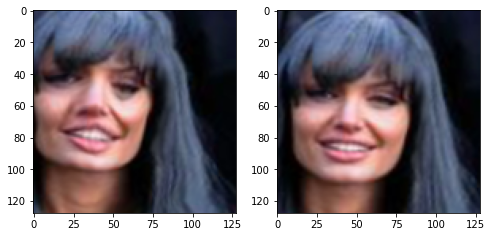

inputs torch.Size([224, 3, 128, 128])
labels torch.Size([224, 3, 128, 128])


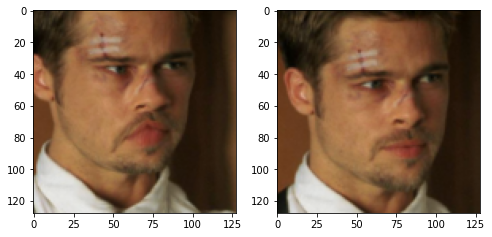

inputs torch.Size([224, 3, 128, 128])
labels torch.Size([224, 3, 128, 128])


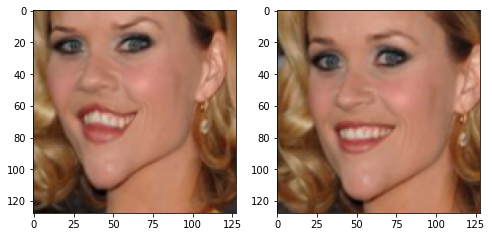

In [8]:
for (inputs, labels) in train_loader_A:
    print("inputs", inputs.shape)
    print("labels", labels.shape)
    # inputs = (inputs * 0.5) + 0.5
    # labels = (labels * 0.5) + 0.5
    fig, ax = plt.subplots(1, 2, figsize=(8,6))
    ax[0].imshow(np.transpose(inputs[0].detach().cpu(), (1,2,0)))
    ax[1].imshow(np.transpose(labels[0].detach().cpu(), (1,2,0)))
    plt.show()

    break

for (inputs, labels) in train_loader_B:
    print("inputs", inputs.shape)
    print("labels", labels.shape)
    # inputs = (inputs * 0.5) + 0.5
    # labels = (labels * 0.5) + 0.5
    fig, ax = plt.subplots(1, 2, figsize=(8,6))
    ax[0].imshow(np.transpose(inputs[0].detach().cpu(), (1,2,0)))
    ax[1].imshow(np.transpose(labels[0].detach().cpu(), (1,2,0)))
    plt.show()
    break    

for (inputs, labels) in train_loader_all:
    print("inputs", inputs.shape)
    print("labels", labels.shape)
    # inputs = (inputs * 0.5) + 0.5
    # labels = (labels * 0.5) + 0.5
    fig, ax = plt.subplots(1, 2, figsize=(8,6))
    ax[0].imshow(np.transpose(inputs[0].detach().cpu(), (1,2,0)))
    ax[1].imshow(np.transpose(labels[0].detach().cpu(), (1,2,0)))
    plt.show()
    break        

In [0]:
class _ConvNd(Module):

    def __init__(self, in_channels, out_channels, kernel_size, stride,
                 padding, dilation, transposed, output_padding, groups, bias):
        super(_ConvNd, self).__init__()
        if in_channels % groups != 0:
            raise ValueError('in_channels must be divisible by groups')
        if out_channels % groups != 0:
            raise ValueError('out_channels must be divisible by groups')
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.kernel_size = kernel_size
        self.stride = stride
        self.padding = padding
        self.dilation = dilation
        self.transposed = transposed
        self.output_padding = output_padding
        self.groups = groups
        if transposed:
            self.weight = Parameter(torch.Tensor(
                in_channels, out_channels // groups, *kernel_size))
        else:
            self.weight = Parameter(torch.Tensor(
                out_channels, in_channels // groups, *kernel_size))
        if bias:
            self.bias = Parameter(torch.Tensor(out_channels))
        else:
            self.register_parameter('bias', None)
        self.reset_parameters()

    def reset_parameters(self):
        n = self.in_channels
        for k in self.kernel_size:
            n *= k
        stdv = 1. / math.sqrt(n)
        self.weight.data.uniform_(-stdv, stdv)
        if self.bias is not None:
            self.bias.data.uniform_(-stdv, stdv)

    def __repr__(self):
        s = ('{name}({in_channels}, {out_channels}, kernel_size={kernel_size}'
             ', stride={stride}')
        if self.padding != (0,) * len(self.padding):
            s += ', padding={padding}'
        if self.dilation != (1,) * len(self.dilation):
            s += ', dilation={dilation}'
        if self.output_padding != (0,) * len(self.output_padding):
            s += ', output_padding={output_padding}'
        if self.groups != 1:
            s += ', groups={groups}'
        if self.bias is None:
            s += ', bias=False'
        s += ')'
        return s.format(name=self.__class__.__name__, **self.__dict__)


class Conv2d(_ConvNd):

    def __init__(self, in_channels, out_channels, kernel_size, stride=1,
                 padding=0, dilation=1, groups=1, bias=True):
        kernel_size = _pair(kernel_size)
        stride = _pair(stride)
        padding = _pair(padding)
        dilation = _pair(dilation)
        super(Conv2d, self).__init__(
            in_channels, out_channels, kernel_size, stride, padding, dilation,
            False, _pair(0), groups, bias)

    def forward(self, input):
        return conv2d_same_padding(input, self.weight, self.bias, self.stride,
                        self.padding, self.dilation, self.groups)


# custom con2d, because pytorch don't have "padding='same'" option.
def conv2d_same_padding(input, weight, bias=None, stride=1, padding=1, dilation=1, groups=1):

    input_rows = input.size(2)
    filter_rows = weight.size(2)
    effective_filter_size_rows = (filter_rows - 1) * dilation[0] + 1
    out_rows = (input_rows + stride[0] - 1) // stride[0]
    padding_needed = max(0, (out_rows - 1) * stride[0] + effective_filter_size_rows -
                  input_rows)
    padding_rows = max(0, (out_rows - 1) * stride[0] +
                        (filter_rows - 1) * dilation[0] + 1 - input_rows)
    rows_odd = (padding_rows % 2 != 0)
    padding_cols = max(0, (out_rows - 1) * stride[0] +
                        (filter_rows - 1) * dilation[0] + 1 - input_rows)
    cols_odd = (padding_rows % 2 != 0)

    if rows_odd or cols_odd:
        input = pad(input, [0, int(cols_odd), 0, int(rows_odd)])

    return F.conv2d(input, weight, bias, stride,
                  padding=(padding_rows // 2, padding_cols // 2),
                  dilation=dilation, groups=groups)

In [0]:
def toTensor(img):
    img = torch.from_numpy(img.transpose((0, 3, 1, 2)))
    return img


def var_to_np(img_var):
    return img_var.data.cpu().numpy()


class _ConvLayer(nn.Sequential):
    def __init__(self, input_features, output_features):
        super(_ConvLayer, self).__init__()
        self.add_module('conv2', Conv2d(input_features, output_features,
                                        kernel_size=3, stride=1))
        self.add_module('leakyrelu', nn.LeakyReLU(0.1, inplace=True))
        self.add_module('conv2_1', Conv2d(output_features, output_features,
                                        kernel_size=3, stride=2))
        self.add_module('leakyrelu_1', nn.LeakyReLU(0.1, inplace=True))

class _UpScale(nn.Sequential):
    def __init__(self, input_features, output_features, padding=1):
        super(_UpScale, self).__init__()
        self.add_module('conv2_', nn.ConvTranspose2d( input_features, output_features, 4, 2, padding, bias=True))
        self.add_module('leakyrelu', nn.LeakyReLU(0.1, inplace=True))

class _UpScalePS(nn.Sequential):
    def __init__(self, input_features, output_features):
        super(_UpScalePS, self).__init__()
        self.add_module('conv2_', Conv2d(input_features, output_features * 4,
                                         kernel_size=3))
        self.add_module('leakyrelu', nn.LeakyReLU(0.1, inplace=True))
        self.add_module('pixelshuffler', _PixelShuffler())

class Flatten(nn.Module):

    def forward(self, input):
        output = input.view(input.size(0), -1)
        return output


class Reshape(nn.Module):

    def forward(self, input):
        output = input.view(-1, 1024, 4, 4)  # channel * 4 * 4

        return output


class _PixelShuffler(nn.Module):
    def forward(self, input):
        batch_size, c, h, w = input.size()
        rh, rw = (2, 2)
        oh, ow = h * rh, w * rw
        oc = c // (rh * rw)
        out = input.view(batch_size, rh, rw, oc, h, w)
        out = out.permute(0, 3, 4, 1, 5, 2).contiguous()
        out = out.view(batch_size, oc, oh, ow)  # channel first

        return out


class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()

        self.encoder = nn.Sequential(
            _ConvLayer(3, 32),
            _ConvLayer(32, 64),
            _ConvLayer(64, 128),
            _ConvLayer(128, 256),
            _ConvLayer(256, 512),
            # Flatten(),
            nn.Conv2d(512, 1024, kernel_size=3, stride=2, padding=1),
            nn.LeakyReLU(0.1),
            # nn.Linear(1024 * 4 * 4, 1024),
            # nn.Linear(1024, 1024 * 4 * 4),
            # Reshape(),
            nn.ConvTranspose2d( 1024, 1536, 4, 2, 1, bias=True),
        )

        self.decoder_A = nn.Sequential(
            _UpScale(1536, 1024, 1),
            _UpScale(1024, 256, 1),
            _UpScale(256, 128, 1),
            _UpScale(128, 64, 1),
            _UpScale(64, 32, 1),
            nn.ConvTranspose2d( 32, 16, 3, 1, 1, bias=True),
            nn.Conv2d(16, 3, 3, 1, padding=1),
            # nn.ConvTranspose2d(32, 3, 3, 1, 1, bias=True),
            nn.Sigmoid(),
        )

        self.decoder_B = nn.Sequential(
            _UpScale(1536, 1024, 1),
            _UpScale(1024, 256, 1),
            _UpScale(256, 128, 1),
            _UpScale(128, 64, 1),
            _UpScale(64, 32, 1),
            nn.ConvTranspose2d( 32, 16, 3, 1, 1, bias=True),
            nn.Conv2d(16, 3, 3, 1, padding=1),
            # nn.ConvTranspose2d(32, 3, 3, 1, 1, bias=True),
            nn.Sigmoid(),
        )

        self.decoder_C = nn.Sequential(
            _UpScale(1536, 1024, 1),
            _UpScale(1024, 256, 1),
            _UpScale(256, 128, 1),
            _UpScale(128, 64, 1),
            _UpScale(64, 32, 1),
            nn.ConvTranspose2d( 32, 16, 3, 1, 1, bias=True),
            nn.Conv2d(16, 3, 3, 1, padding=1),
            # nn.ConvTranspose2d(32, 3, 3, 1, 1, bias=True),
            nn.Sigmoid(),
        )

    def forward(self, x, select='A'):
        out = self.encoder(x)

        if select == 'A':    
            out = self.decoder_A(out)
        elif select == 'B':
            out = self.decoder_B(out)
        else:
            out = self.decoder_C(out)
        return out

In [0]:
def get_transpose_axes(n):
    if n % 2 == 0:
        y_axes = list(range(1, n - 1, 2))
        x_axes = list(range(0, n - 1, 2))
    else:
        y_axes = list(range(0, n - 1, 2))
        x_axes = list(range(1, n - 1, 2))
    return y_axes, x_axes, [n - 1]


def stack_images(images):
    images_shape = numpy.array(images.shape)
    new_axes = get_transpose_axes(len(images_shape))
    new_shape = [numpy.prod(images_shape[x]) for x in new_axes]
    return numpy.transpose(
        images,
        axes=numpy.concatenate(new_axes)
    ).reshape(new_shape)

In [0]:
device = torch.device('cuda:0')
cudnn.benchmark = True

model = Autoencoder().to(device)

criterion = nn.L1Loss()
optimizer_1 = optim.Adam([{'params': model.encoder.parameters()},
                          {'params': model.decoder_A.parameters()}]
                         , lr=5e-5, betas=(0.5, 0.999))
optimizer_2 = optim.Adam([{'params': model.encoder.parameters()},
                          {'params': model.decoder_B.parameters()}]
                         , lr=5e-5, betas=(0.5, 0.999))
optimizer_3 = optim.Adam([{'params': model.encoder.parameters()},
                          {'params': model.decoder_C.parameters()}]
                         , lr=5e-5, betas=(0.5, 0.999))

# add learning rate decay
decay_lr = 0.90
lr_1 = ExponentialLR(optimizer_1, gamma=decay_lr)
lr_2 = ExponentialLR(optimizer_2, gamma=decay_lr)
lr_3 = ExponentialLR(optimizer_3, gamma=decay_lr)

In [13]:
def count_params(model):
  model_parameters = filter(lambda p: p.requires_grad, model.parameters())
  params = sum([np.prod(p.size()) for p in model_parameters])
  return params       

print("Encoder:", count_params(model.encoder))
print("Decoder:", count_params(model.decoder_A))

Encoder: 34599200
Decoder: 30054819


In [0]:
n_epochs = 1000
cuda = True
log_interval = 250
plot_images = 250
print_metrics = 5

def save_model(epoch, model_name):
    print('===> Saving models...')
    state = {
        'state': model.state_dict(),
        'epoch': epoch,
        'opt_1': optimizer_1.state_dict(),
        'opt_2': optimizer_2.state_dict(),
    }
    if not os.path.isdir('checkpoint'):
        os.mkdir('checkpoint')
    torch.save(state, './checkpoint/' + model_name)

    return

def load_model(model_name):
  if os.path.isdir('checkpoint'):
    try:
        checkpoint = torch.load('./checkpoint/' + model_name)
        model.load_state_dict(checkpoint['state'])
        optimizer_1.load_state_dict(checkpoint['opt_1'])
        optimizer_2.load_state_dict(checkpoint['opt_2'])
        start_epoch = checkpoint['epoch']
        print('===> Load last checkpoint data, resuming from epoch', start_epoch)
    except FileNotFoundError:
        print('Can\'t find', model_name)
        start_epoch=0

    return start_epoch

def train(n_epochs=n_epochs, train_loader_A=train_loader_female, train_loader_B=train_loader_male, train_loader_C=train_loader_all, resume=True, lr_decay_epochs=500, print_metrics=10, start_from=None, plot_images=plot_images, model_name='autoencoder.t7'):
    if resume and os.path.isdir('checkpoint'):
        epoch = start_epoch = load_model(model_name)
    else:
        start_epoch = 0
        print('===> Start from scratch')

    try:
        print("Training...")
        if start_from is not None:
            start_epoch = start_from

        for epoch in range(start_epoch, n_epochs):
            tr_losses_A = []
            tr_losses_B = []
            tr_losses_C = []

            for i, (warped_A, target_A) in enumerate(train_loader_A):
                warped_B, target_B = next(iter(train_loader_B))
                warped_C, target_C = next(iter(train_loader_C))
                
                if cuda:
                    warped_A = warped_A.to(device).float()
                    target_A = target_A.to(device).float()
                    warped_B = warped_B.to(device).float()
                    target_B = target_B.to(device).float()
                    warped_C = warped_C.to(device).float()
                    target_C = target_C.to(device).float()

                warped_A = model(warped_A, 'A')
                warped_B = model(warped_B, 'B')
                warped_C = model(warped_C, 'C')

                loss1 = criterion(warped_A, target_A)
                loss2 = criterion(warped_B, target_B)
                loss3 = criterion(warped_C, target_C)
                loss = loss1.item() + loss2.item() + loss3.item()
                
                optimizer_1.zero_grad()
                loss1.backward()
                optimizer_1.step()

                optimizer_2.zero_grad()
                loss2.backward()
                optimizer_2.step()

                optimizer_3.zero_grad()
                loss3.backward()
                optimizer_3.step()

                tr_losses_A.append(loss1.item())
                tr_losses_B.append(loss2.item())
                tr_losses_C.append(loss3.item())

                if i % 100 == 0 and i > 0:
                    print('epoch: {} [{}/{}], lossA: {}, lossB: {}, lossC: {}'.format(epoch, i, len(train_loader_A), np.mean(tr_losses_A), np.mean(tr_losses_B), np.mean(tr_losses_C)))

            if epoch % lr_decay_epochs == 0 and epoch > 0:
                lr_1.step()
                lr_2.step()

            if epoch % print_metrics == 0:
                print('epoch: {}, lossA: {}, lossB: {}, lossC: {}'.format(epoch, np.mean(tr_losses_A), np.mean(tr_losses_B), np.mean(tr_losses_C)))

            if epoch % log_interval == 0 and epoch > 0:
                save_model(epoch, model_name)

            if epoch % plot_images == 0:
                with torch.no_grad():
                    swapped_A = model(target_A, 'B')
                    swapped_B = model(target_B, 'A')
                    swapped_CA = model(target_C, 'A')
                    swapped_CB = model(target_C, 'B')

                    fig, ax = plt.subplots(3, 3, figsize=(12,12))
                    ax[0,0].imshow(np.transpose(vutils.make_grid(target_B.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
                    ax[0,0].set_title("Original")
                    ax[0,1].imshow(np.transpose(vutils.make_grid(warped_B.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
                    ax[0,1].set_title("Decoded")
                    ax[0,2].imshow(np.transpose(vutils.make_grid(swapped_B.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
                    ax[0,2].set_title("Swapped")
                    ax[1,0].imshow(np.transpose(vutils.make_grid(target_A.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
                    ax[1,0].set_title("Original")
                    ax[1,1].imshow(np.transpose(vutils.make_grid(warped_A.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
                    ax[1,1].set_title("Decoded")
                    ax[1,2].imshow(np.transpose(vutils.make_grid(swapped_A.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
                    ax[1,2].set_title("Swapped")
                    ax[2,0].imshow(np.transpose(vutils.make_grid(target_C.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
                    ax[2,0].set_title("Original")
                    ax[2,1].imshow(np.transpose(vutils.make_grid(swapped_CB.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
                    ax[2,1].set_title("Swapped B")
                    ax[2,2].imshow(np.transpose(vutils.make_grid(swapped_CA.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
                    ax[2,2].set_title("Swapped A")
                    plt.show()
        
    except KeyboardInterrupt:
        print("Interrupting...")

    save_model(epoch, model_name)      

    !gsutil cp ./checkpoint/{model_name} gs://{bucket_name}/{model_name}
    return

In [15]:
load_model("autoencoder128i.pt")

===> Load last checkpoint data, resuming from epoch 15499


15499

===> Start from scratch
Training...
epoch: 0, lossA: 0.23041975019233568, lossB: 0.23184904296483314, lossC: 0.22675189535532678


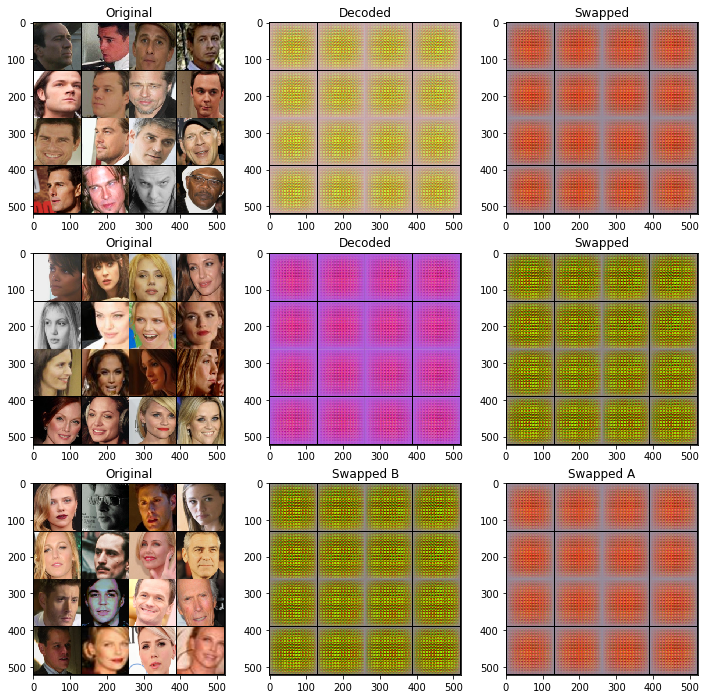

epoch: 1, lossA: 0.21429237936224257, lossB: 0.21514427182929857, lossC: 0.2163714872939246
epoch: 2, lossA: 0.1754512047129018, lossB: 0.18090603819915227, lossC: 0.17827891079442842
epoch: 3, lossA: 0.15006930913243974, lossB: 0.15521632507443428, lossC: 0.15240432534899032
epoch: 4, lossA: 0.13310076376157148, lossB: 0.13830902959619248, lossC: 0.13635158405772277
epoch: 5, lossA: 0.12711198148982866, lossB: 0.1325738179896559, lossC: 0.130566504118698
epoch: 6, lossA: 0.12271023674735002, lossB: 0.12764677831104823, lossC: 0.12535413753773486
epoch: 7, lossA: 0.12020595983735152, lossB: 0.12356745877436229, lossC: 0.12295018056673664
epoch: 8, lossA: 0.11639910537217345, lossB: 0.1192271669528314, lossC: 0.11824261184249606
epoch: 9, lossA: 0.11560653948358127, lossB: 0.11758492700755596, lossC: 0.11750712378748826
epoch: 10, lossA: 0.11294742833290781, lossB: 0.11590036643402916, lossC: 0.11363714294774192
Interrupting...
===> Saving models...
Copying file://./checkpoint/autoencod

In [0]:
train(n_epochs=20, train_loader_A=train_loader_female, train_loader_B=train_loader_male, model_name="autoencoder128i.pt", print_metrics=1, resume=False)

In [0]:
train(n_epochs=30, train_loader_A=train_loader_female, train_loader_B=train_loader_male, model_name="autoencoder128i.pt", print_metrics=1)

===> Load last checkpoint data, resuming from epoch 19
Training...
epoch: 19, lossA: 0.09558028154648267, lossB: 0.09795746264549401, lossC: 0.09734430450659531
epoch: 20, lossA: 0.09442970271293934, lossB: 0.09729653883438844, lossC: 0.09627636006245247
epoch: 21, lossA: 0.09425422434623425, lossB: 0.09641039199554004, lossC: 0.09581658244132996
epoch: 22, lossA: 0.09530666986337075, lossB: 0.09762756583782342, lossC: 0.0961606353521347
epoch: 23, lossA: 0.09263731768498054, lossB: 0.09543670771213678, lossC: 0.09365104654660591
epoch: 24, lossA: 0.09329278423235966, lossB: 0.09548290704305355, lossC: 0.09380512971144456
epoch: 25, lossA: 0.0919801088479849, lossB: 0.09450375059476265, lossC: 0.09375864095412768
epoch: 26, lossA: 0.09202818744457684, lossB: 0.09413663641764568, lossC: 0.09321284408752735
epoch: 27, lossA: 0.09206970895712192, lossB: 0.09377532452344894, lossC: 0.0935575136771569
epoch: 28, lossA: 0.09110325001753293, lossB: 0.09338072515450992, lossC: 0.09188139553253

===> Load last checkpoint data, resuming from epoch 29
Training...
epoch: 30, lossA: 0.09674487635493279, lossB: 0.09733667224645615, lossC: 0.0938606970012188
epoch: 40, lossA: 0.0910850539803505, lossB: 0.09287552908062935, lossC: 0.09013662487268448
epoch: 50, lossA: 0.08791784197092056, lossB: 0.09045035764575005, lossC: 0.08966867625713348
epoch: 60, lossA: 0.08991093188524246, lossB: 0.0910833552479744, lossC: 0.08984839916229248
epoch: 70, lossA: 0.08833691850304604, lossB: 0.09078598394989967, lossC: 0.08876396343111992
epoch: 80, lossA: 0.08669760450720787, lossB: 0.08818026259541512, lossC: 0.08967353776097298
epoch: 90, lossA: 0.08509990945458412, lossB: 0.08758451417088509, lossC: 0.08839939534664154
epoch: 100, lossA: 0.0880330242216587, lossB: 0.09009907767176628, lossC: 0.08931931480765343
epoch: 110, lossA: 0.08283977955579758, lossB: 0.08420735597610474, lossC: 0.08591298758983612
epoch: 120, lossA: 0.17355217039585114, lossB: 0.16319097578525543, lossC: 0.168507829308

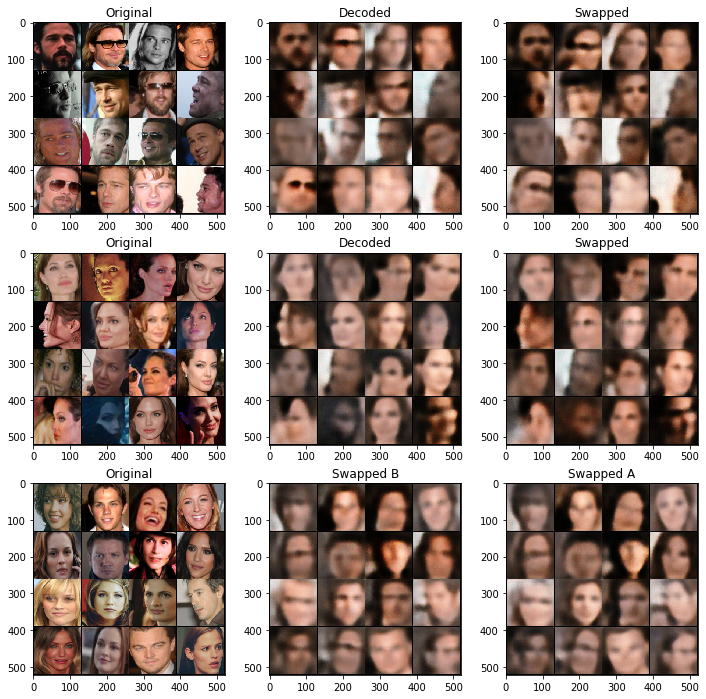

epoch: 260, lossA: 0.07802914455533028, lossB: 0.07960501313209534, lossC: 0.08197090402245522
epoch: 270, lossA: 0.07767025753855705, lossB: 0.0800417847931385, lossC: 0.08106137067079544
epoch: 280, lossA: 0.077036302536726, lossB: 0.07999957725405693, lossC: 0.08194426819682121
epoch: 290, lossA: 0.07678214460611343, lossB: 0.07831621170043945, lossC: 0.07917614281177521
epoch: 300, lossA: 0.07786206901073456, lossB: 0.07946635037660599, lossC: 0.08206170424818993
epoch: 310, lossA: 0.07862917333841324, lossB: 0.07906902208924294, lossC: 0.08356280624866486
epoch: 320, lossA: 0.07923675328493118, lossB: 0.08084569498896599, lossC: 0.08273537456989288
epoch: 330, lossA: 0.07795318588614464, lossB: 0.07910555973649025, lossC: 0.08218454569578171
epoch: 340, lossA: 0.07608094438910484, lossB: 0.0771394595503807, lossC: 0.0807226188480854
epoch: 350, lossA: 0.07657716050744057, lossB: 0.07734096795320511, lossC: 0.07955734431743622
epoch: 360, lossA: 0.07396712526679039, lossB: 0.076807

In [0]:
train(n_epochs=500, train_loader_A=train_loader_A, train_loader_B=train_loader_B, model_name="autoencoder128i.pt")a

===> Load last checkpoint data, resuming from epoch 2499
Training...
epoch: 2500, lossA: 0.05441517196595669, lossB: 0.05535728111863136, lossC: 0.06479770317673683
===> Saving models...


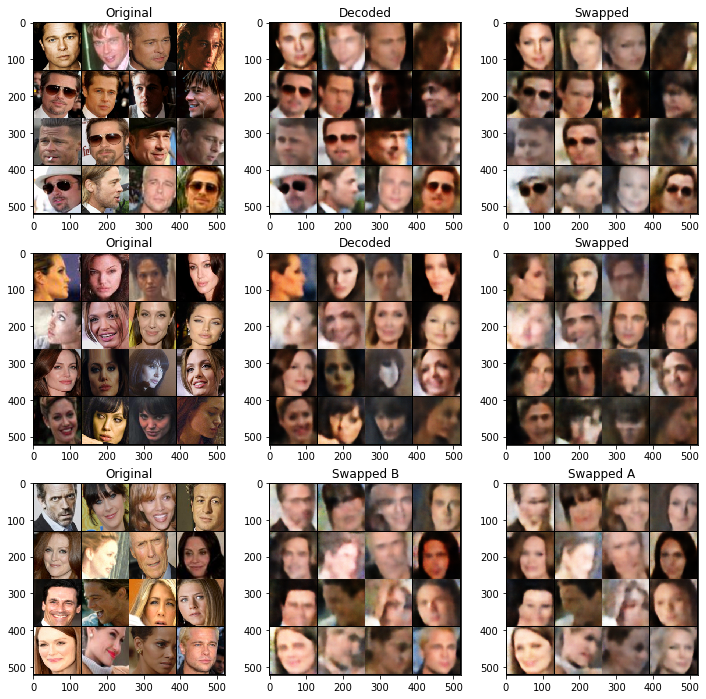

epoch: 2510, lossA: 0.05136251077055931, lossB: 0.0529787614941597, lossC: 0.06338760629296303
epoch: 2520, lossA: 0.050974875688552856, lossB: 0.05233948305249214, lossC: 0.06331414356827736
epoch: 2530, lossA: 0.05040019936859608, lossB: 0.05269746109843254, lossC: 0.0632509458810091
epoch: 2540, lossA: 0.05076806619763374, lossB: 0.051701776683330536, lossC: 0.06338257528841496
epoch: 2550, lossA: 0.05143551528453827, lossB: 0.05240151472389698, lossC: 0.06449661776423454
epoch: 2560, lossA: 0.051856543868780136, lossB: 0.05252337455749512, lossC: 0.0650407187640667
epoch: 2570, lossA: 0.04993945546448231, lossB: 0.05218025855720043, lossC: 0.06462112069129944
epoch: 2580, lossA: 0.050403961911797523, lossB: 0.051363563165068626, lossC: 0.06322301179170609
epoch: 2590, lossA: 0.05076274275779724, lossB: 0.05211554281413555, lossC: 0.06389977410435677
epoch: 2600, lossA: 0.050267113372683525, lossB: 0.05199938826262951, lossC: 0.06182176619768143
epoch: 2610, lossA: 0.051555627956986

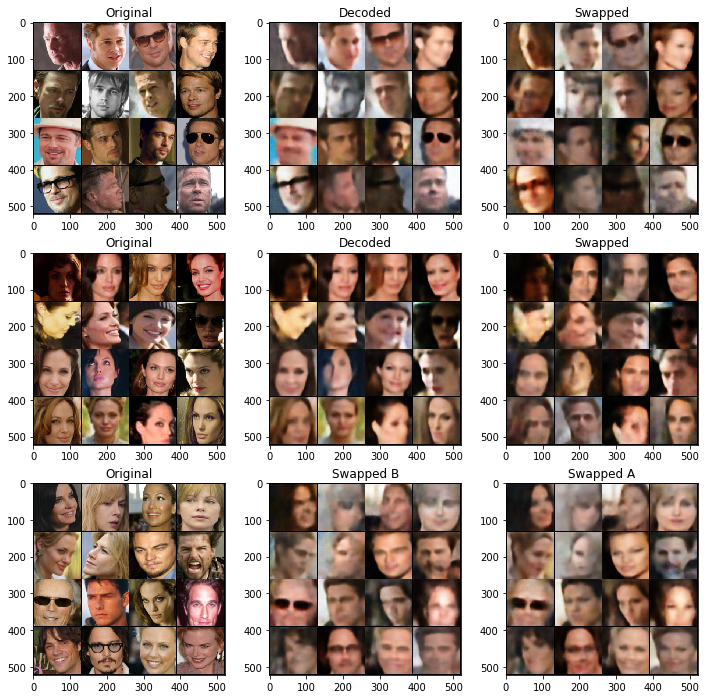

epoch: 2760, lossA: 0.04968440160155296, lossB: 0.051611633971333504, lossC: 0.06348442286252975
epoch: 2770, lossA: 0.049858326092362404, lossB: 0.050646888092160225, lossC: 0.062046151608228683
epoch: 2780, lossA: 0.04928135871887207, lossB: 0.05205858685076237, lossC: 0.06297158263623714
epoch: 2790, lossA: 0.0508586335927248, lossB: 0.05153842084109783, lossC: 0.06378018856048584
epoch: 2800, lossA: 0.05011322349309921, lossB: 0.05127229727804661, lossC: 0.06246086768805981
epoch: 2810, lossA: 0.049778299406170845, lossB: 0.05152009427547455, lossC: 0.06359359622001648
epoch: 2820, lossA: 0.0505327507853508, lossB: 0.05235113762319088, lossC: 0.06360364705324173
epoch: 2830, lossA: 0.04951693303883076, lossB: 0.050626737996935844, lossC: 0.06123463064432144
epoch: 2840, lossA: 0.05080223269760609, lossB: 0.051693398505449295, lossC: 0.06344786658883095
epoch: 2850, lossA: 0.04958466626703739, lossB: 0.05052115395665169, lossC: 0.06281496211886406
epoch: 2860, lossA: 0.0507271587848

In [0]:
train(n_epochs=3000, train_loader_A=train_loader_A, train_loader_B=train_loader_B, model_name="autoencoder128i.pt")

===> Load last checkpoint data, resuming from epoch 5499
Training...
epoch: 5500, lossA: 0.04500066675245762, lossB: 0.04612177796661854, lossC: 0.05415557324886322
===> Saving models...


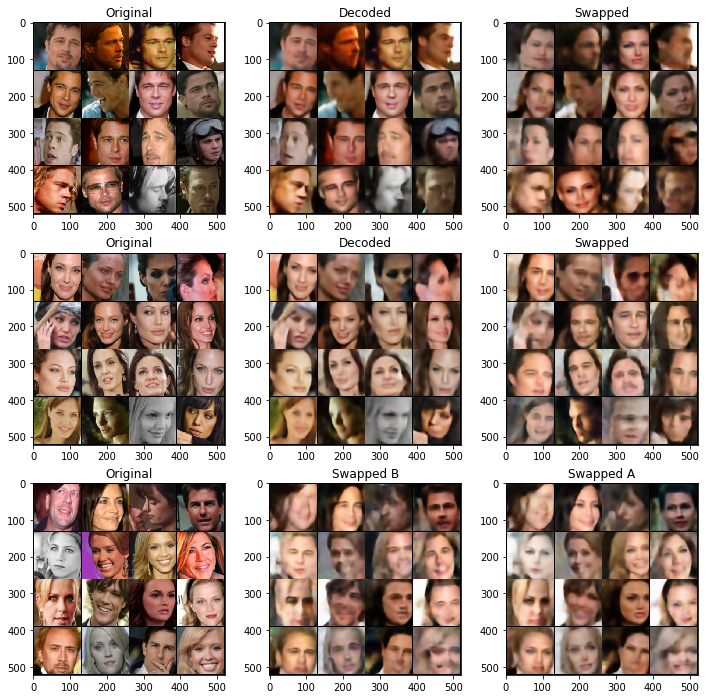

epoch: 5510, lossA: 0.041981158778071404, lossB: 0.04397423379123211, lossC: 0.05164819769561291
epoch: 5520, lossA: 0.042744556441903114, lossB: 0.04365237057209015, lossC: 0.05208133906126022
epoch: 5530, lossA: 0.04210474714636803, lossB: 0.043936118483543396, lossC: 0.05220016650855541
epoch: 5540, lossA: 0.04197324253618717, lossB: 0.04366176016628742, lossC: 0.05256548523902893
epoch: 5550, lossA: 0.043496012687683105, lossB: 0.04439324326813221, lossC: 0.05338502861559391
epoch: 5560, lossA: 0.04245934821665287, lossB: 0.04364107362926006, lossC: 0.05270115099847317
epoch: 5570, lossA: 0.04309095814824104, lossB: 0.0444200336933136, lossC: 0.0528224129229784
epoch: 5580, lossA: 0.041979800909757614, lossB: 0.04358149506151676, lossC: 0.051883671432733536
epoch: 5590, lossA: 0.04222099669277668, lossB: 0.04377703182399273, lossC: 0.053029799833893776
epoch: 5600, lossA: 0.041894301772117615, lossB: 0.043406372889876366, lossC: 0.051326991990208626
epoch: 5610, lossA: 0.0426676981

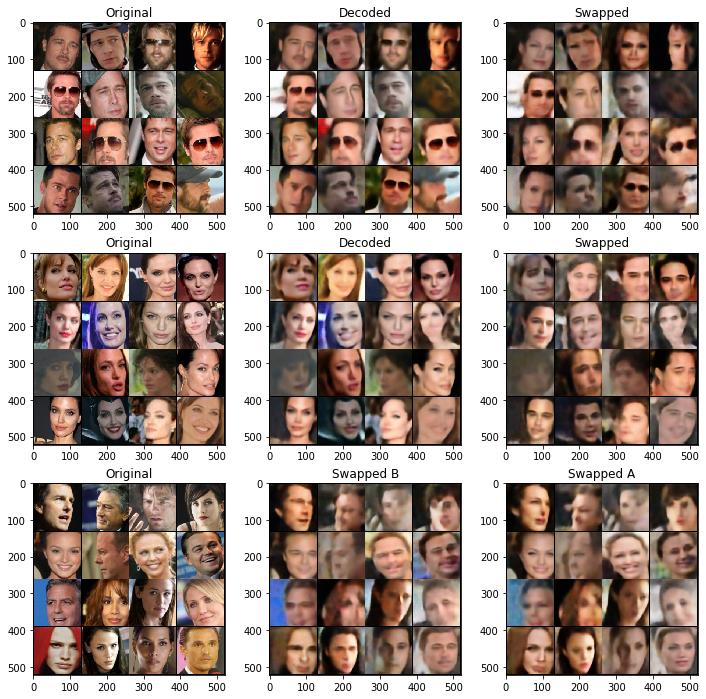

epoch: 5760, lossA: 0.04166042432188988, lossB: 0.0435023158788681, lossC: 0.052057985216379166
epoch: 5770, lossA: 0.0426026675850153, lossB: 0.04404832050204277, lossC: 0.052402202039957047
epoch: 5780, lossA: 0.04176171123981476, lossB: 0.043571438640356064, lossC: 0.05095052719116211
epoch: 5790, lossA: 0.04195043444633484, lossB: 0.04329708032310009, lossC: 0.05098036304116249
epoch: 5800, lossA: 0.042159365490078926, lossB: 0.04352395050227642, lossC: 0.051982028409838676
epoch: 5810, lossA: 0.04132423736155033, lossB: 0.043128909543156624, lossC: 0.05045727267861366
epoch: 5820, lossA: 0.04273954965174198, lossB: 0.04463500715792179, lossC: 0.052130818367004395
epoch: 5830, lossA: 0.04148180037736893, lossB: 0.04324132390320301, lossC: 0.051140690222382545
epoch: 5840, lossA: 0.04293995536863804, lossB: 0.043454281985759735, lossC: 0.05175507627427578
epoch: 5850, lossA: 0.042211005464196205, lossB: 0.04332869499921799, lossC: 0.05159902200102806
epoch: 5860, lossA: 0.0413680057

In [0]:
train(n_epochs=6000, train_loader_A=train_loader_A, train_loader_B=train_loader_B, model_name="autoencoder128i.pt")

===> Load last checkpoint data, resuming from epoch 7499
Training...
epoch: 7500, lossA: 0.04132833331823349, lossB: 0.04324103891849518, lossC: 0.04984922707080841
===> Saving models...


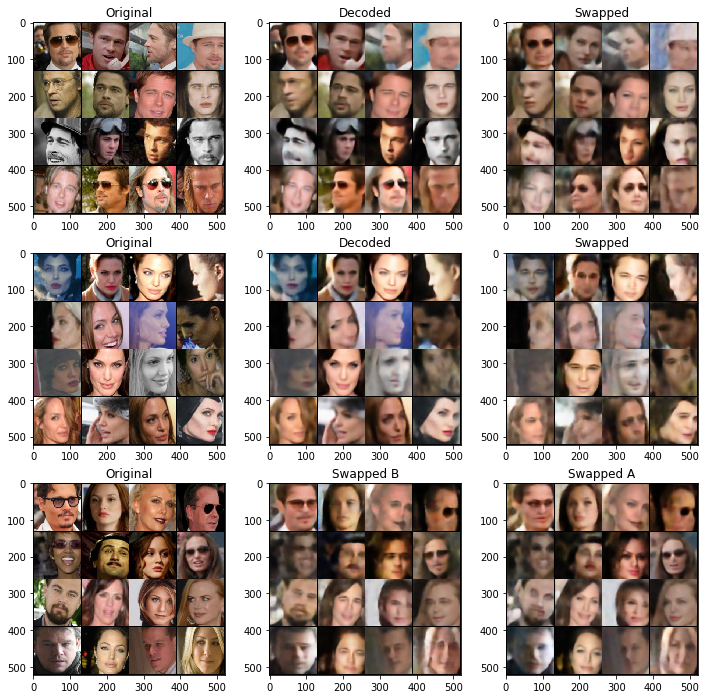

epoch: 7510, lossA: 0.0400201715528965, lossB: 0.04182619787752628, lossC: 0.04775831289589405
epoch: 7520, lossA: 0.04014625959098339, lossB: 0.04215101711452007, lossC: 0.04811800457537174
epoch: 7530, lossA: 0.03959147818386555, lossB: 0.04221119545400143, lossC: 0.048245253041386604
epoch: 7540, lossA: 0.03944667801260948, lossB: 0.04067031480371952, lossC: 0.047733889892697334
epoch: 7550, lossA: 0.039852725341916084, lossB: 0.04123849235475063, lossC: 0.04742820747196674
epoch: 7560, lossA: 0.03960558772087097, lossB: 0.04144374094903469, lossC: 0.048161210492253304
epoch: 7570, lossA: 0.04013819061219692, lossB: 0.04212279058992863, lossC: 0.04891519248485565
epoch: 7580, lossA: 0.03978102281689644, lossB: 0.04138026759028435, lossC: 0.048349831253290176
epoch: 7590, lossA: 0.03971126861870289, lossB: 0.041850047186017036, lossC: 0.04714987799525261
epoch: 7600, lossA: 0.03949618153274059, lossB: 0.04156705550849438, lossC: 0.04795372858643532
epoch: 7610, lossA: 0.0407273713499

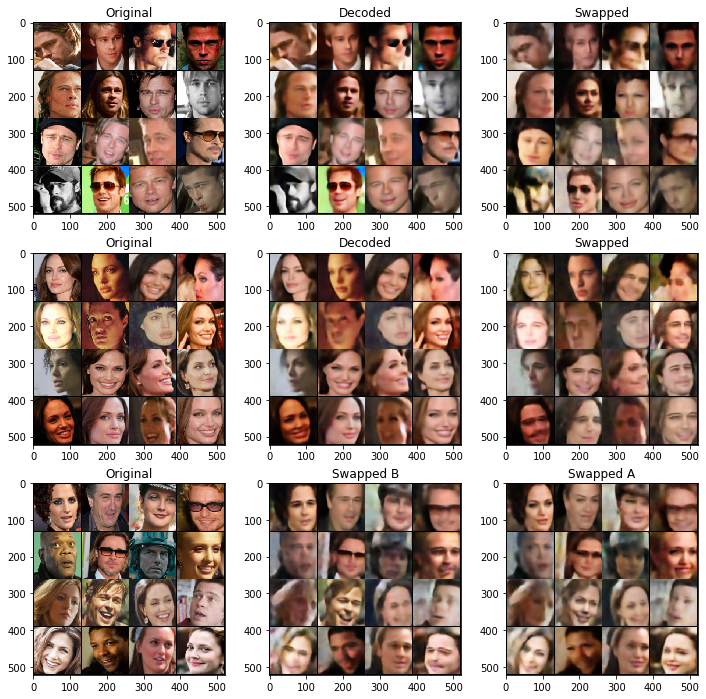

epoch: 7760, lossA: 0.03897983394563198, lossB: 0.04132851026952267, lossC: 0.04732567258179188
epoch: 7770, lossA: 0.03951242379844189, lossB: 0.04069838859140873, lossC: 0.04875514842569828
epoch: 7780, lossA: 0.039842480793595314, lossB: 0.04121945984661579, lossC: 0.047309985384345055
epoch: 7790, lossA: 0.03921143338084221, lossB: 0.04131072759628296, lossC: 0.04732287675142288
epoch: 7800, lossA: 0.039036400616168976, lossB: 0.040859175845980644, lossC: 0.04634620249271393
epoch: 7810, lossA: 0.03912135399878025, lossB: 0.0418254267424345, lossC: 0.04749533347785473
epoch: 7820, lossA: 0.03957831859588623, lossB: 0.0415369588881731, lossC: 0.048908257856965065
epoch: 7830, lossA: 0.03961687162518501, lossB: 0.04169163294136524, lossC: 0.04738392494618893
epoch: 7840, lossA: 0.039370257407426834, lossB: 0.04121759906411171, lossC: 0.04694257117807865
epoch: 7850, lossA: 0.040177490562200546, lossB: 0.042161956429481506, lossC: 0.04769570380449295
epoch: 7860, lossA: 0.039482107385

In [0]:
train(n_epochs=8000, train_loader_A=train_loader_A, train_loader_B=train_loader_B, model_name="autoencoder128i.pt")

===> Load last checkpoint data, resuming from epoch 13499
Training...
epoch: 13500, lossA: 0.03884865902364254, lossB: 0.0403251089155674, lossC: 0.043030090630054474
===> Saving models...


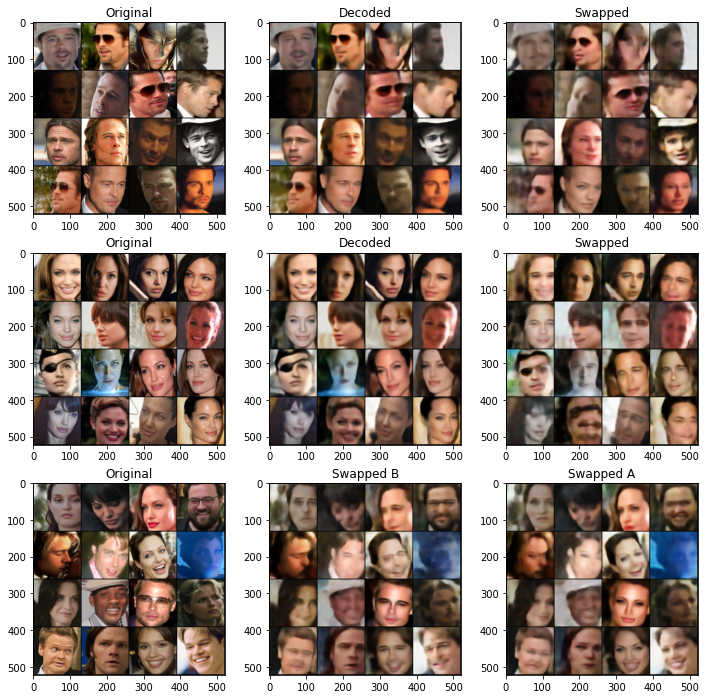

epoch: 13510, lossA: 0.037084247916936874, lossB: 0.03816326521337032, lossC: 0.042053740471601486
epoch: 13520, lossA: 0.036766478791832924, lossB: 0.03875086084008217, lossC: 0.04279783368110657
epoch: 13530, lossA: 0.036742014810442924, lossB: 0.03910624235868454, lossC: 0.04320000112056732
epoch: 13540, lossA: 0.037309685721993446, lossB: 0.03866001404821873, lossC: 0.04327934794127941
epoch: 13550, lossA: 0.03699983470141888, lossB: 0.038985537365078926, lossC: 0.04333610273897648
epoch: 13560, lossA: 0.03696414828300476, lossB: 0.03855748102068901, lossC: 0.04399246908724308
epoch: 13570, lossA: 0.03692241199314594, lossB: 0.038685210049152374, lossC: 0.043550049886107445
epoch: 13580, lossA: 0.03695518709719181, lossB: 0.03958986699581146, lossC: 0.04352380149066448
epoch: 13590, lossA: 0.03668254427611828, lossB: 0.038755156099796295, lossC: 0.04225834831595421
epoch: 13600, lossA: 0.03636341355741024, lossB: 0.03854173421859741, lossC: 0.04283035546541214
epoch: 13610, lossA: 

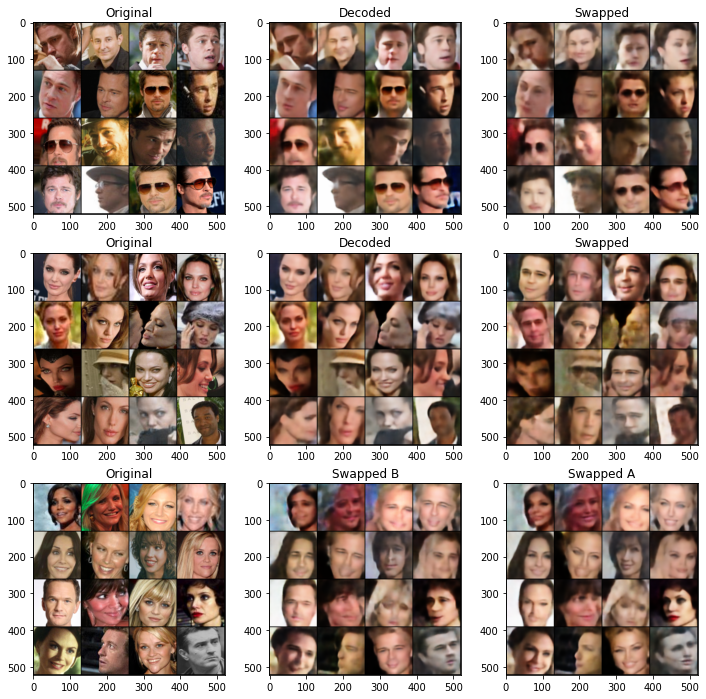

epoch: 13760, lossA: 0.03742431662976742, lossB: 0.038261519744992256, lossC: 0.0443574171513319
epoch: 13770, lossA: 0.037394220009446144, lossB: 0.03873285464942455, lossC: 0.043186454102396965
epoch: 13780, lossA: 0.036497293040156364, lossB: 0.038129838183522224, lossC: 0.04280550219118595
epoch: 13790, lossA: 0.03668422996997833, lossB: 0.03804180957376957, lossC: 0.04277281276881695
epoch: 13800, lossA: 0.03635011240839958, lossB: 0.03805229067802429, lossC: 0.042103180661797523
epoch: 13810, lossA: 0.03659574128687382, lossB: 0.03837628290057182, lossC: 0.042932890355587006
epoch: 13820, lossA: 0.0376410186290741, lossB: 0.0386193823069334, lossC: 0.04364815168082714
epoch: 13830, lossA: 0.03634806536138058, lossB: 0.03829631395637989, lossC: 0.04304155521094799
epoch: 13840, lossA: 0.03646186925470829, lossB: 0.03796415030956268, lossC: 0.043321024626493454
epoch: 13850, lossA: 0.03675717115402222, lossB: 0.03828813135623932, lossC: 0.042130064219236374
epoch: 13860, lossA: 0.0

In [16]:
train(n_epochs=14000, train_loader_A=train_loader_A, train_loader_B=train_loader_B, model_name="autoencoder128i.pt")

===> Load last checkpoint data, resuming from epoch 15499
Training...
epoch: 15500, lossA: 0.03778453357517719, lossB: 0.03918795473873615, lossC: 0.04302884265780449
===> Saving models...


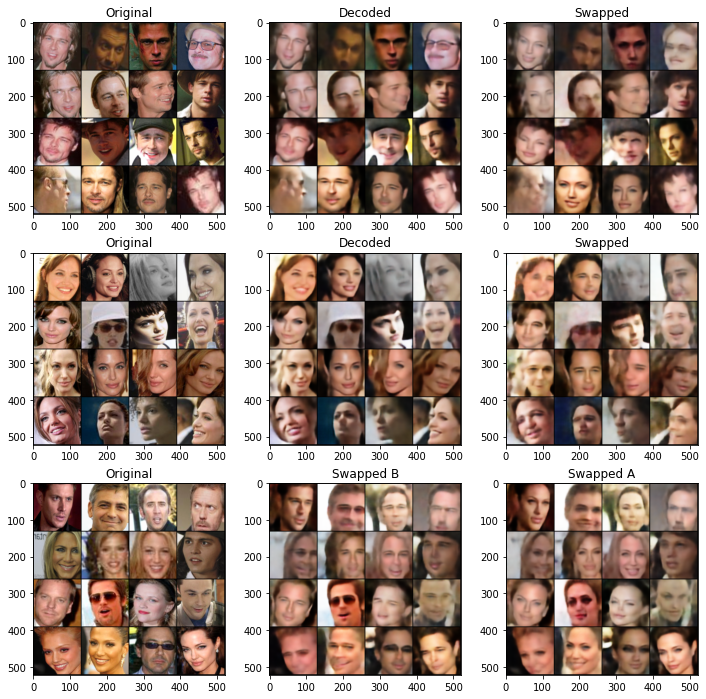

epoch: 15510, lossA: 0.03585343807935715, lossB: 0.03780975751578808, lossC: 0.04168245010077953
epoch: 15520, lossA: 0.03584744222462177, lossB: 0.03810647502541542, lossC: 0.042318474501371384
epoch: 15530, lossA: 0.03680475614964962, lossB: 0.03801936097443104, lossC: 0.04294886812567711
epoch: 15540, lossA: 0.03678771108388901, lossB: 0.038015738129615784, lossC: 0.04337847977876663
epoch: 15550, lossA: 0.03568419627845287, lossB: 0.03804037906229496, lossC: 0.041689906269311905
epoch: 15560, lossA: 0.036281097680330276, lossB: 0.037988921627402306, lossC: 0.04187527298927307
epoch: 15570, lossA: 0.036028629168868065, lossB: 0.03835436888039112, lossC: 0.042265940457582474
epoch: 15580, lossA: 0.03612374886870384, lossB: 0.03761022724211216, lossC: 0.04216841422021389


Exception ignored in: <bound method _MultiProcessingDataLoaderIter.__del__ of <torch.utils.data.dataloader._MultiProcessingDataLoaderIter object at 0x7fddd36d8fd0>>
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/torch/utils/data/dataloader.py", line 961, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.6/dist-packages/torch/utils/data/dataloader.py", line 941, in _shutdown_workers
    w.join()
  File "/usr/lib/python3.6/multiprocessing/process.py", line 124, in join
    res = self._popen.wait(timeout)
  File "/usr/lib/python3.6/multiprocessing/popen_fork.py", line 50, in wait
    return self.poll(os.WNOHANG if timeout == 0.0 else 0)
  File "/usr/lib/python3.6/multiprocessing/popen_fork.py", line 28, in poll
    pid, sts = os.waitpid(self.pid, flag)
KeyboardInterrupt: 


RuntimeError: ignored

In [16]:
train(n_epochs=16000, train_loader_A=train_loader_A, train_loader_B=train_loader_B, model_name="autoencoder128i.pt")

In [23]:
# lr_1.step()
# lr_2.step()

for pg in optimizer_1.param_groups:
  # pg['lr'] = 1e-5
  print(pg['lr'])

for pg in optimizer_2.param_groups:
  # pg['lr'] = 1e-5
  print(pg['lr'])  

for pg in optimizer_3.param_groups:
  # pg['lr'] = 1e-5
  print(pg['lr'])  

1e-05
1e-05
1e-05
1e-05
1e-05
1e-05


In [0]:
# save_model(3400, "autoencoder128f.pt")

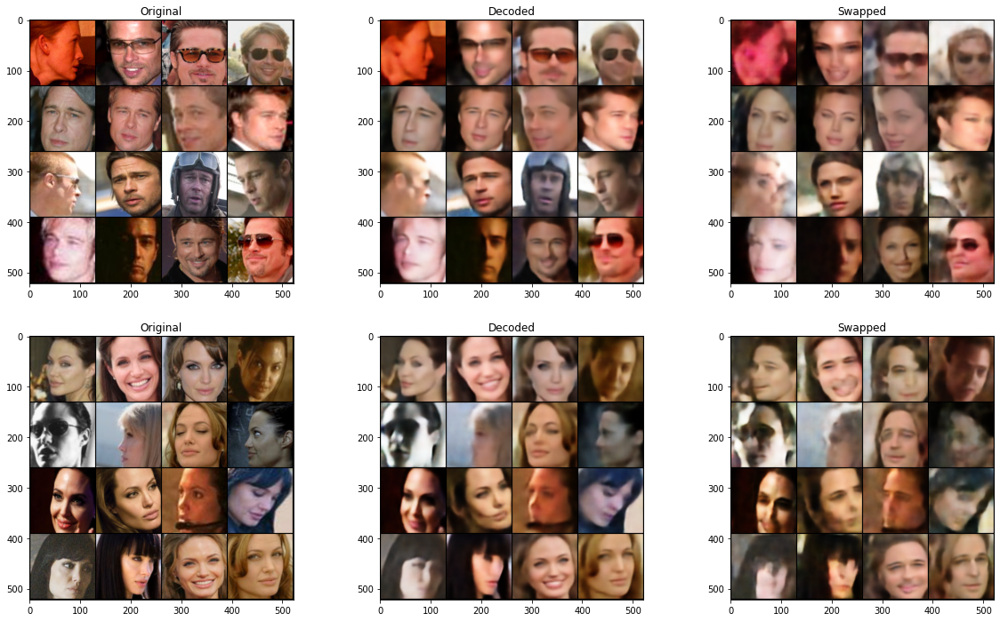

In [19]:
with torch.no_grad():
    warped_A, target_A = next(iter(train_loader_A))
    warped_B, target_B = next(iter(train_loader_B))

    target_A = target_A.cuda()
    target_B = target_B.cuda()

    decoded_A = model(warped_A.cuda(), 'A')
    decoded_B = model(warped_B.cuda(), 'B')
    swapped_A = model(target_A, 'B')
    swapped_B = model(target_B, 'A')

    fig, ax = plt.subplots(2, 3, figsize=(20,12))
    ax[0,0].imshow(np.transpose(vutils.make_grid(target_B.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[0,0].set_title("Original")
    ax[0,1].imshow(np.transpose(vutils.make_grid(decoded_B.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[0,1].set_title("Decoded")
    ax[0,2].imshow(np.transpose(vutils.make_grid(swapped_B.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[0,2].set_title("Swapped")
    ax[1,0].imshow(np.transpose(vutils.make_grid(target_A.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[1,0].set_title("Original")
    ax[1,1].imshow(np.transpose(vutils.make_grid(decoded_A.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[1,1].set_title("Decoded")
    ax[1,2].imshow(np.transpose(vutils.make_grid(swapped_A.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[1,2].set_title("Swapped")
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


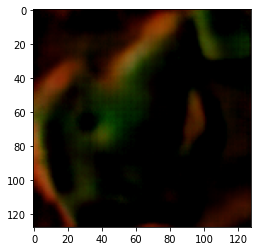

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


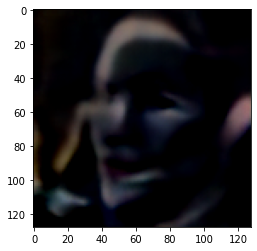

In [20]:
plt.imshow((decoded_B.cuda()[0] - swapped_B[0]).detach().cpu().numpy().transpose((1,2,0)))
plt.show()

plt.imshow((decoded_A.cuda()[0] - swapped_A[0]).detach().cpu().numpy().transpose((1,2,0)))
plt.show()

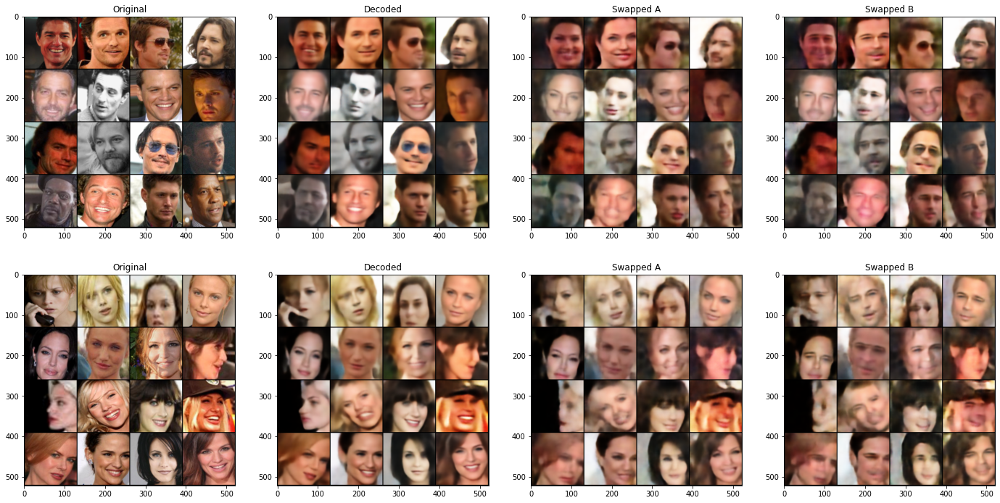

In [21]:
with torch.no_grad():
    warped_A, target_A = next(iter(train_loader_female))
    warped_B, target_B = next(iter(train_loader_male))

    target_A = target_A.cuda()
    target_B = target_B.cuda()

    decoded_A = model(warped_A.cuda(), 'C')
    decoded_B = model(warped_B.cuda(), 'C')
    swapped_AB = model(target_A, 'B')
    swapped_AA = model(target_A, 'A')
    swapped_BB = model(target_B, 'B')
    swapped_BA = model(target_B, 'A')
    
    fig, ax = plt.subplots(2, 4, figsize=(24,12))
    ax[0,0].imshow(np.transpose(vutils.make_grid(target_B.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[0,0].set_title("Original")
    ax[0,1].imshow(np.transpose(vutils.make_grid(decoded_B.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[0,1].set_title("Decoded")
    ax[0,2].imshow(np.transpose(vutils.make_grid(swapped_BA.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[0,2].set_title("Swapped A")
    ax[0,3].imshow(np.transpose(vutils.make_grid(swapped_BB.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[0,3].set_title("Swapped B")
    ax[1,0].imshow(np.transpose(vutils.make_grid(target_A.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[1,0].set_title("Original")
    ax[1,1].imshow(np.transpose(vutils.make_grid(decoded_A.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[1,1].set_title("Decoded")
    ax[1,2].imshow(np.transpose(vutils.make_grid(swapped_AA.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[1,2].set_title("Swapped A")
    ax[1,3].imshow(np.transpose(vutils.make_grid(swapped_AB.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[1,3].set_title("Swapped B")
    plt.show()